In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
import rioxarray
import pandas as pd
from pathlib import Path
import json
from pyproj import CRS, Transformer
import warnings

# Suppress warnings
warnings.filterwarnings('ignore', message='The given provided crs is not equal to the raster crs')

In [2]:
def load_and_visualize_tile(input_folder_path):
    """
    Reads saved 12-band tile data (including NDVI, NDCI, SCL) and metadata 
    from a folder and visualizes the results individually.

    Args:
        input_folder_path (str | Path): The directory containing the saved tile data.
    """
    print("--- Starting Tile Loading and Visualization ---")
    input_dir = Path(input_folder_path)
    
    # 1. Load Metadata
    try:
        with open(input_dir / "metadata.json", "r") as f:
            metadata = json.load(f)
    except FileNotFoundError:
        print(f"Error: metadata.json not found in {input_dir}")
        return

    item_id = metadata["item_id"]
    tile_size = metadata["tile_size_10m_pixels"]
    points_data = pd.DataFrame(metadata["points_data"])
    
    print(f"1) Original Image ID: {item_id}")
    print(f"2) Tile Size: {tile_size} x {tile_size} pixels (10m resolution)")

    # 2. Load Rasters
    # List of all 12 expected tiles
    assets_to_load = [
        "visual", "B02", "B03", "B04", "B08", "B05", "B06", "B07", "B8A", 
        "SCL", "NDVI", "NDCI"
    ]
    loaded_data = {}
    
    for band_key in assets_to_load:
        file_path = input_dir / f"{band_key}_tile.tif"
        try:
            # We use masked=True to handle the NaN values in NDVI/NDCI correctly
            da = rioxarray.open_rasterio(file_path, masked=True)
            loaded_data[band_key] = da
        except Exception as e:
            print(f"Could not load {band_key}_tile.tif: {e}")
            return
    
    # 3. Setup for Visualization
    
    # Get CRS and Transformer from one of the loaded rasters
    sample_da = loaded_data["visual"]
    target_crs = sample_da.rio.crs
    
    # Transform Lat/Lon points to the image's UTM CRS
    transformer_latlon_to_utm = Transformer.from_crs(CRS.from_string("EPSG:4326"), target_crs, always_xy=True)
    point_x, point_y = transformer_latlon_to_utm.transform(points_data.lon.values, points_data.lat.values)

    # Custom SCL colormap setup (must match Code 1)
    colors = ['white', 'white', 'black', 'black', 'green', 'saddlebrown', 'lightblue', 'grey', 'grey', 'grey', 'grey']
    cmap_scl = ListedColormap(colors)
    bounds = np.arange(12)
    norm_scl = BoundaryNorm(bounds, cmap_scl.N) 
    
    # Define all 12 assets to plot
    assets_to_plot = {
        "visual": ("True Color (RGB)", None, None, False, None, None),
        "B02": ("Band 2 (Blue)", "gray", None, True, None, None),
        "B03": ("Band 3 (Green)", "gray", None, True, None, None),
        "B04": ("Band 4 (Red)", "gray", None, True, None, None),
        "B08": ("Band 8 (NIR)", "gray", None, True, None, None),
        "B05": ("Band 5 (Red Edge 1)", "gray", None, True, None, None),
        "B06": ("Band 6 (Red Edge 2)", "gray", None, True, None, None),
        "B07": ("Band 7 (Red Edge 3)", "gray", None, True, None, None),
        "B8A": ("Band 8A (Red Edge 4)", "gray", None, True, None, None),
        "SCL": ("Scene Classification (SCL)", cmap_scl, norm_scl, False, None, None),
        "NDVI": ("NDVI (Vegetation)", "RdYlGn", None, True, -1, 1),
        "NDCI": ("NDCI (Chlorophyll)", "jet", None, True, -1, 1) 
    }
    
    # 4. Individual Visualization
    for band_key, (title, cmap, norm, add_colorbar, vmin, vmax) in assets_to_plot.items():
        da = loaded_data[band_key]
        
        fig, ax = plt.subplots(figsize=(15, 15))
        
        # Get the extent for correct plotting and point overlay
        extent = [
            da.x.min(), 
            da.x.max(), 
            da.y.min(), 
            da.y.max()
        ]
        
        # Squeeze to remove the band dimension if present (which it is for single bands/indices)
        if da.ndim > 2 and band_key != "visual":
             da = da.squeeze()

        if band_key == "visual":
            # RGB usually handles orientation automatically, but we trust xarray here
            da.plot.imshow(ax=ax, rgb="band", robust=True)
        elif band_key == "SCL":
            scl_data = da.values
            ax.imshow(scl_data, cmap=cmap, norm=norm, extent=extent, origin='upper')
        else:
            # Apply VMIN/VMAX if present, otherwise use robust scaling
            robust_setting = True if vmin is None else False
            
            da.plot.imshow(
                ax=ax, 
                cmap=cmap, 
                robust=robust_setting, 
                add_colorbar=add_colorbar, 
                origin='upper', 
                extent=extent, 
                norm=norm,
                vmin=vmin,
                vmax=vmax
            )
            

        # Overlay points on the plot
        ax.scatter(point_x, point_y, c='red', s=100, marker='x', linewidths=2.5)
        
        ax.set_title(f"Loaded Tile: {title} - ID: {item_id}", fontsize=16)
        ax.set_xlabel("UTM Easting (m)")
        ax.set_ylabel("UTM Northing (m)")
        plt.show()

--- Starting Tile Loading and Visualization ---
1) Original Image ID: S2B_MSIL2A_20190828T175919_R041_T13TCH_20201005T061026
2) Tile Size: 1024 x 1024 pixels (10m resolution)


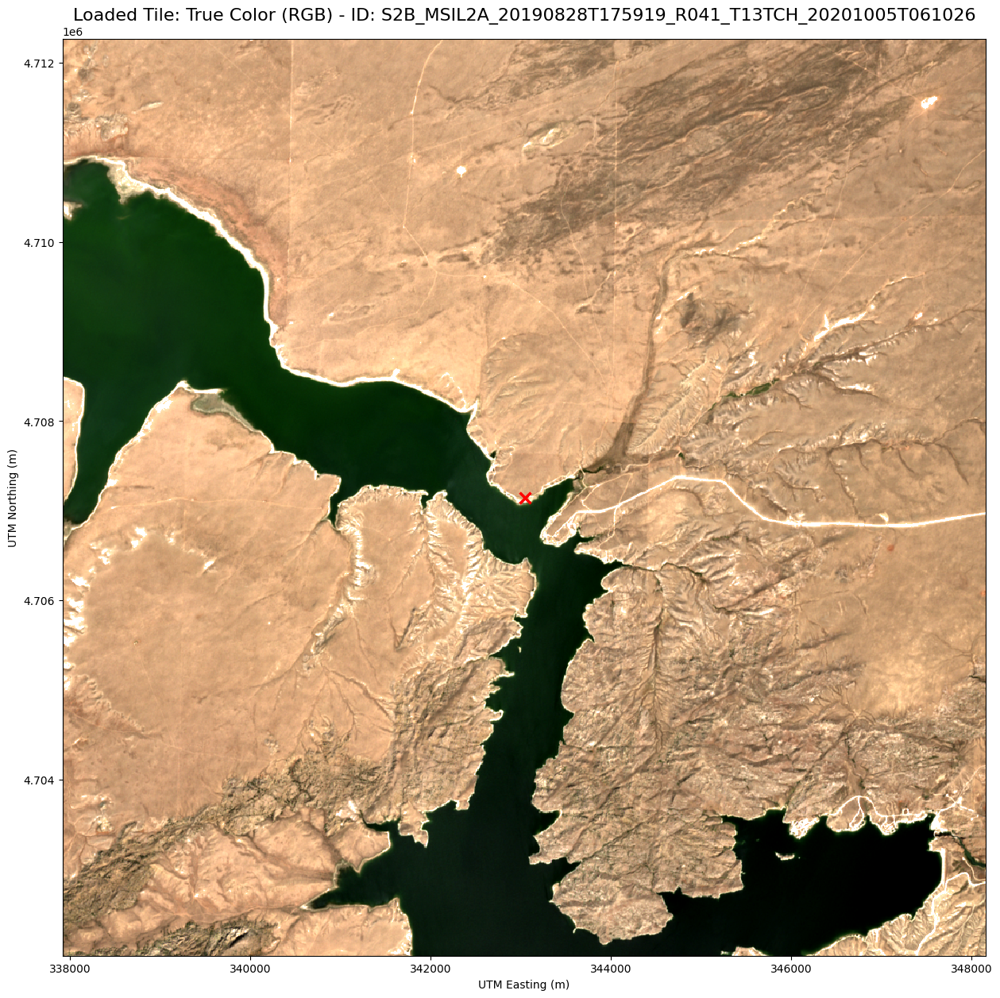

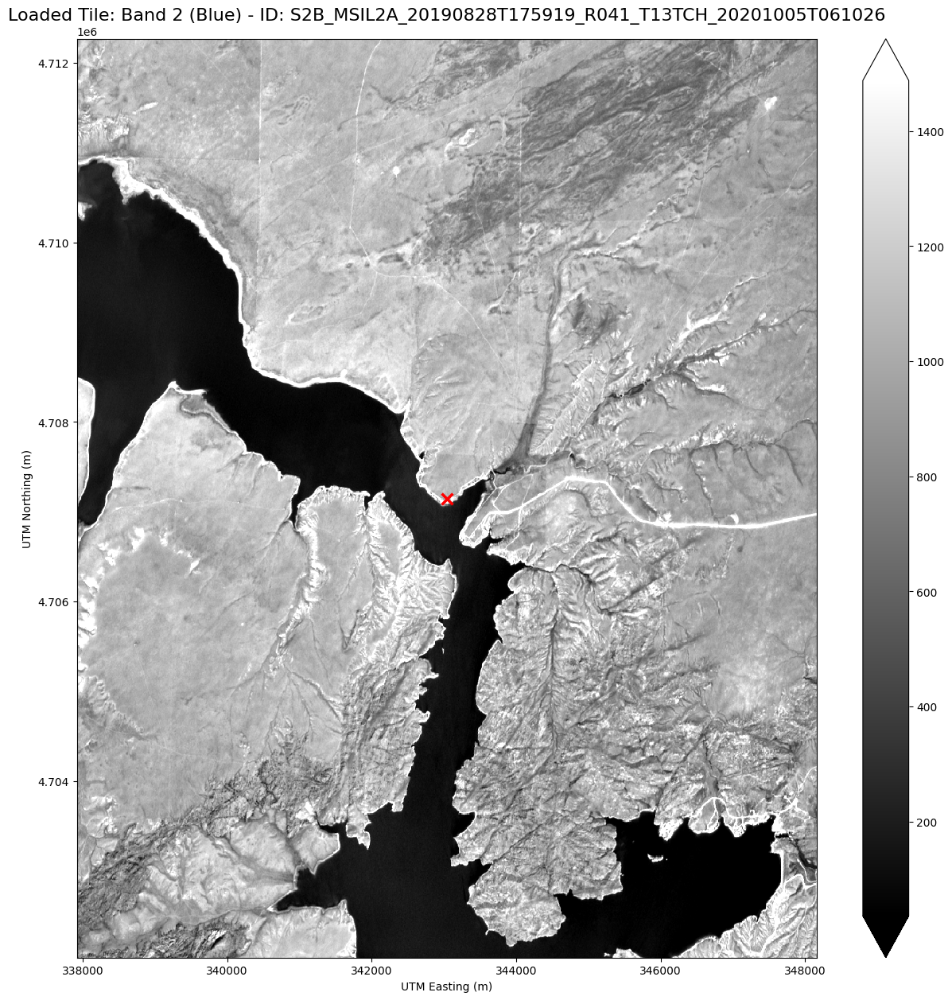

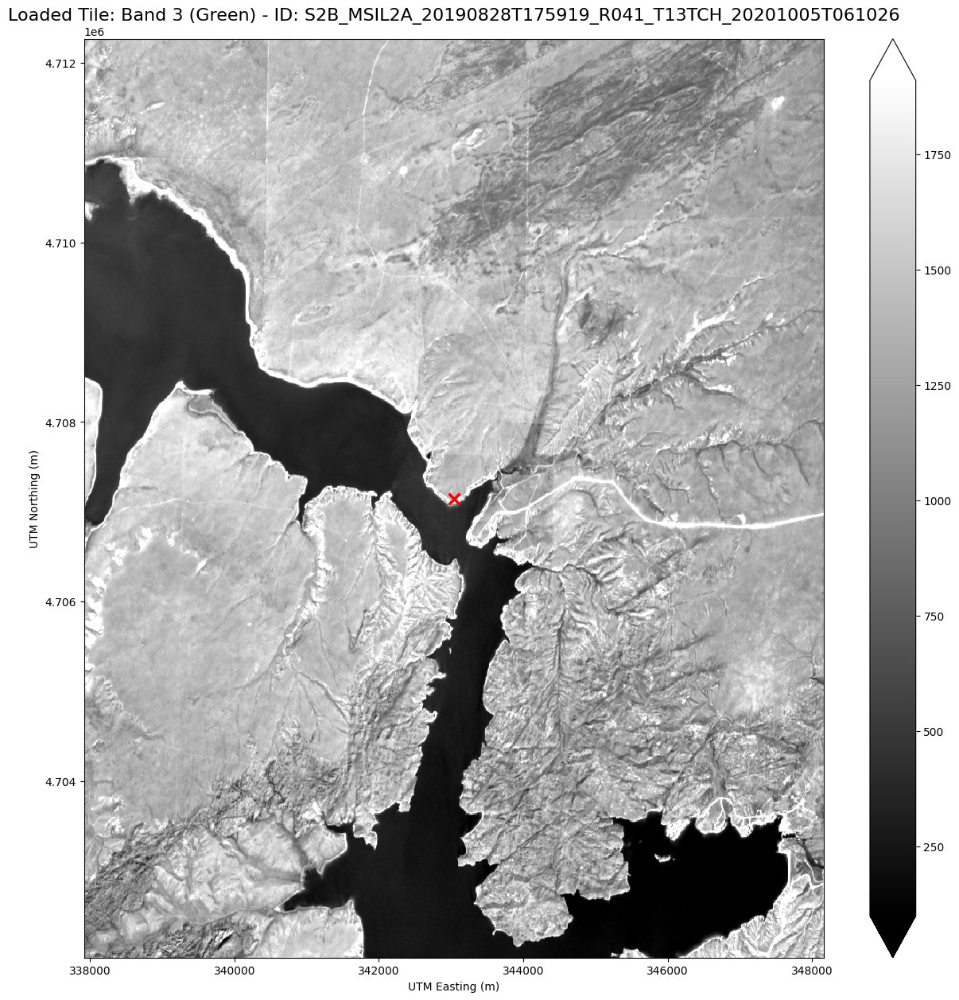

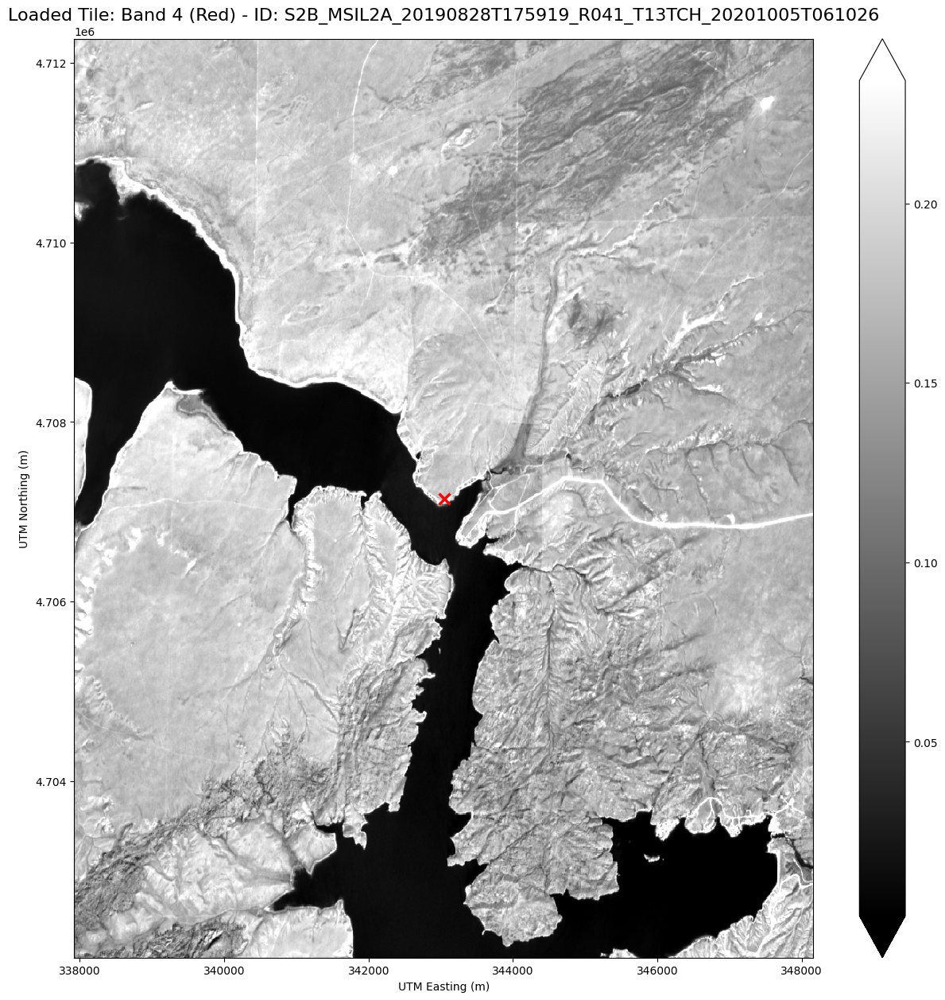

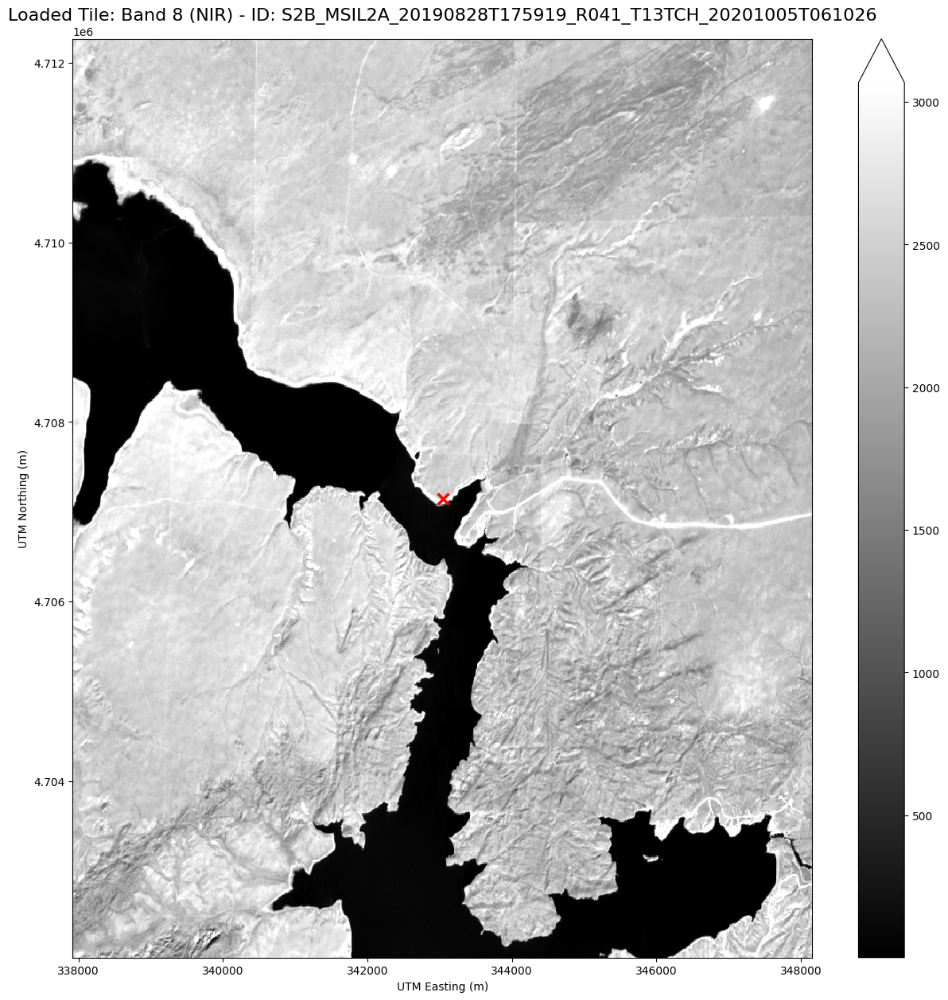

...

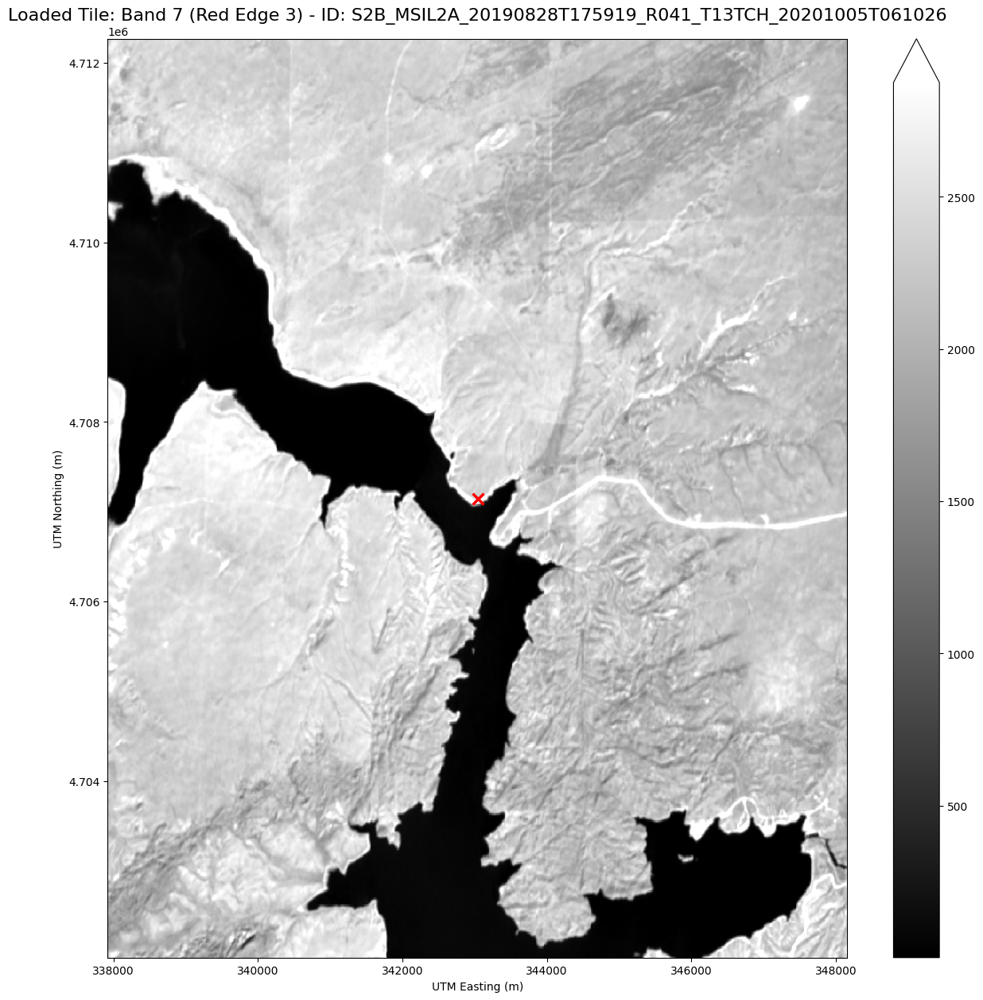

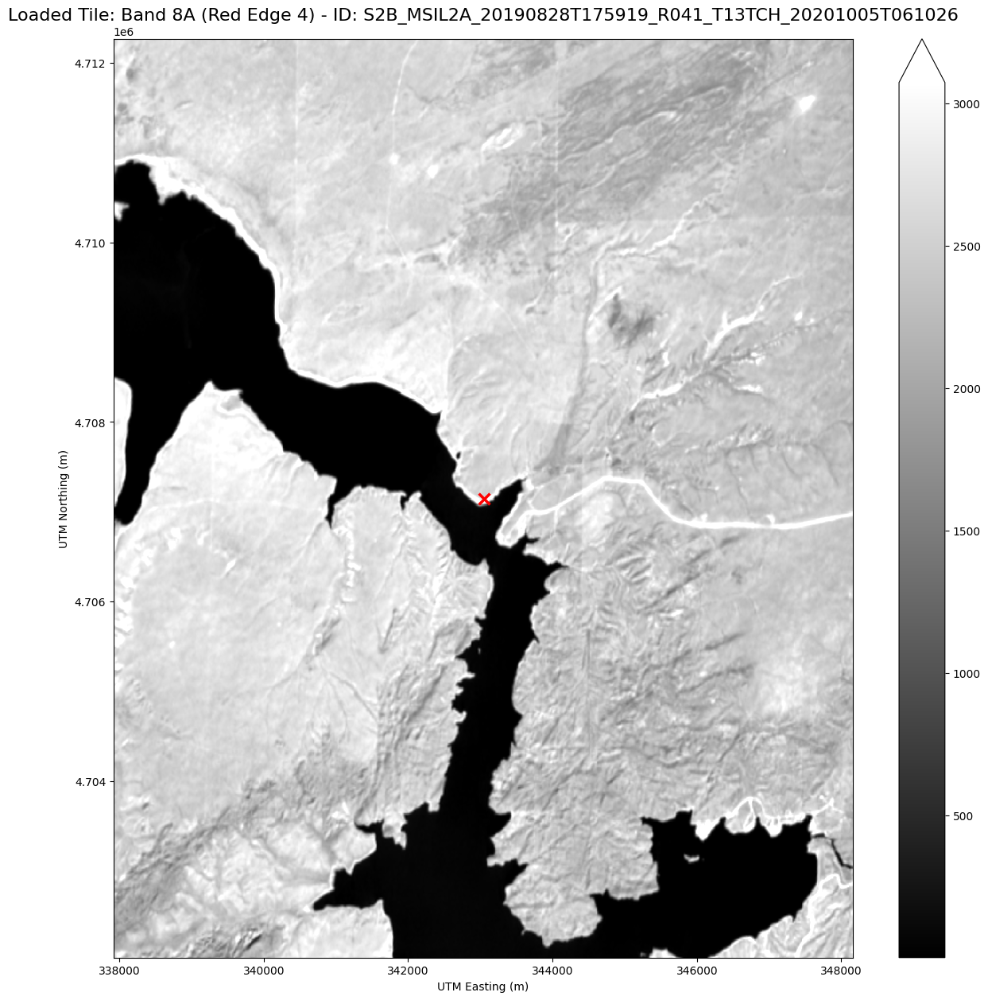

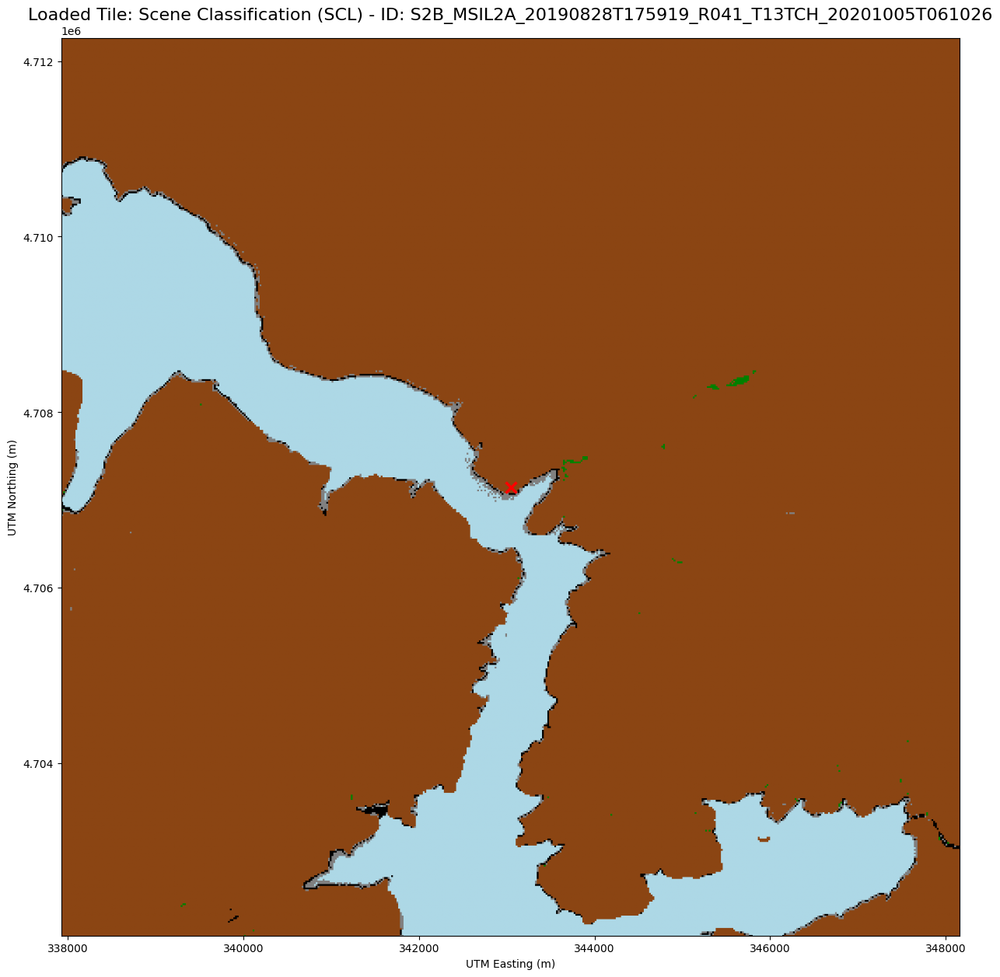

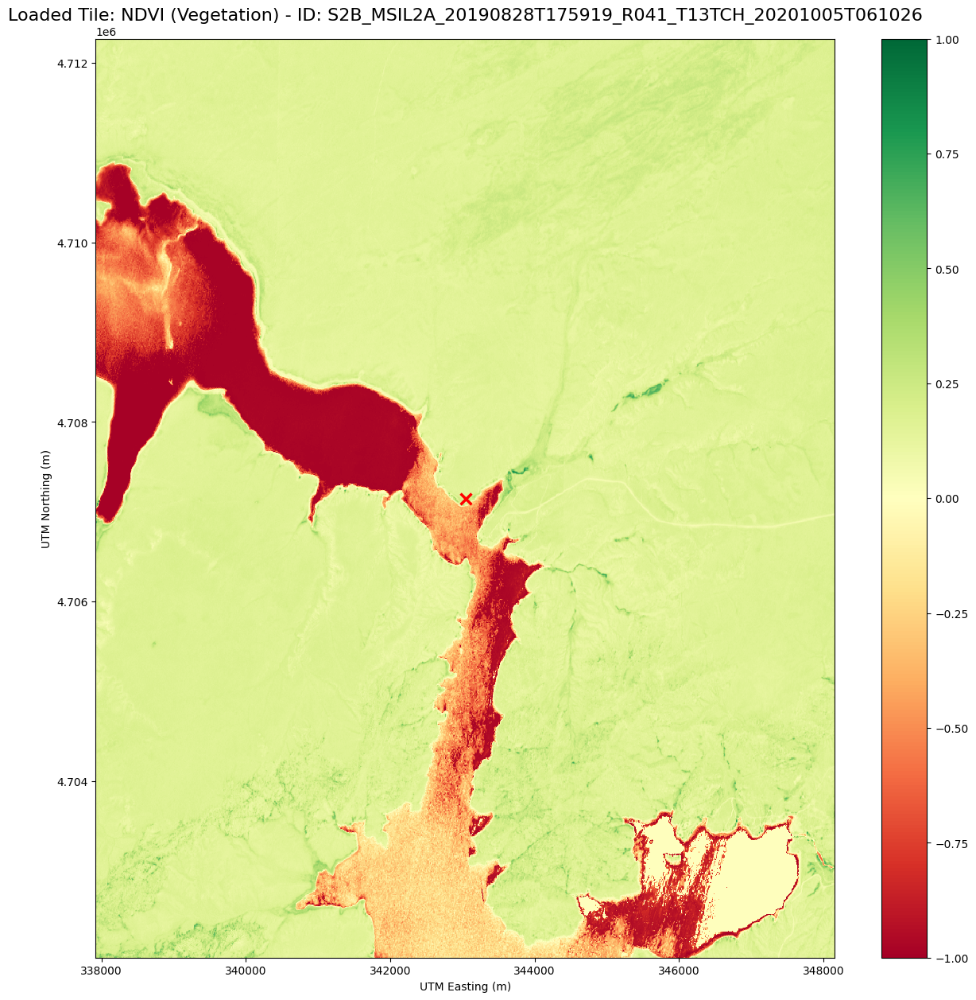

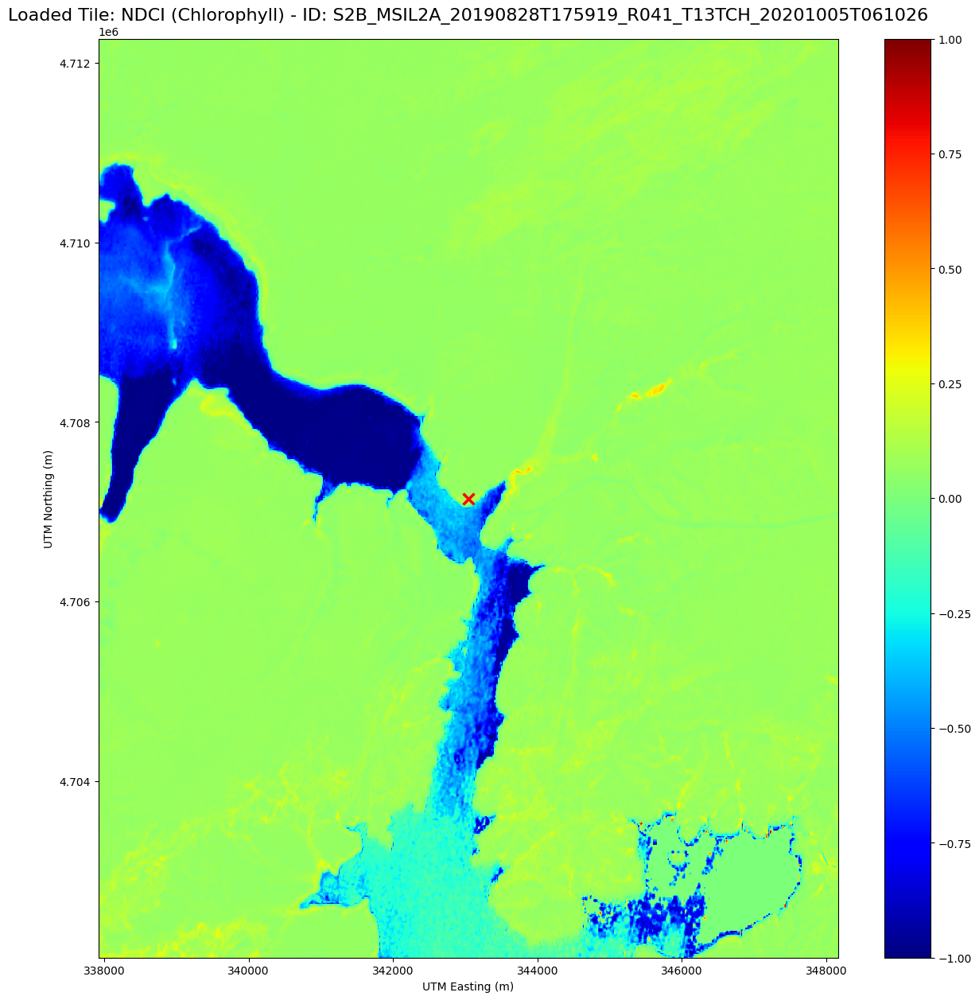

In [3]:
load_and_visualize_tile(r"C:\Users\KostasPikounis\OneDrive_Inlecom_Personal\OneDrive - INLECOM\Amfitrite\task2\IWD\sat data test\case22820_abun154kpred470_1024_date2019-08-28")